# GPU Check before Training

In [2]:
!nvidia-smi

Sun Jun 23 02:50:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


# Install Ultralytics for loading Yolov8 model

In [3]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import display, Image

# Importing dataset from Roboflow (Annotated Images)

In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet
from roboflow import Roboflow
rf = Roboflow(api_key="fvWHxWzCw7RMU6CcQa6H")
project = rf.workspace("football-jazjg").project("object-detection-in-football")
version = project.version(1)
dataset = version.download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.9 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Object-Detection-in-Football-1 in yolov8:: 100%|██████████| 1158/1158 [00:00<00:00, 2876.56it/s]


# Tracking loss plots through tensorflow

In [6]:
#@title Select YOLOv8 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

<IPython.core.display.Javascript object>

# Train for 100 epochs

In [7]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 193MB/s]
New https://pypi.org/project/ultralytics/8.2.39 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Object-Detection-in-Football-1/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_s

# Predict on test set (26 Images)

In [10]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/26 /content/datasets/Object-Detection-in-Football-1/test/images/SNMOT-060000241_jpg.rf.05e05c4cd97c1ba2610e31f1a9209e4d.jpg: 640x640 14 Players, 2 Referees, 16.4ms
image 2/26 /content/datasets/Object-Detection-in-Football-1/test/images/SNMOT-060000601_jpg.rf.ad76856b660c1bf5b5d789ad1df4001b.jpg: 640x640 1 Ball, 11 Players, 2 Referees, 16.4ms
image 3/26 /content/datasets/Object-Detection-in-Football-1/test/images/SNMOT-061000541_jpg.rf.0422a6ff3f350aea87097c6c4f9a69d1.jpg: 640x640 1 Ball, 7 Players, 1 Referee, 16.3ms
image 4/26 /content/datasets/Object-Detection-in-Football-1/test/images/SNMOT-061000661_jpg.rf.4bf08b3a58300ff0c82c5bf64c4e23e6.jpg: 640x640 14 Players, 2 Referees, 16.3ms
image 5/26 /content/datasets/Object-Detection-in-Football-1/test/images/SNMOT

# Display test results

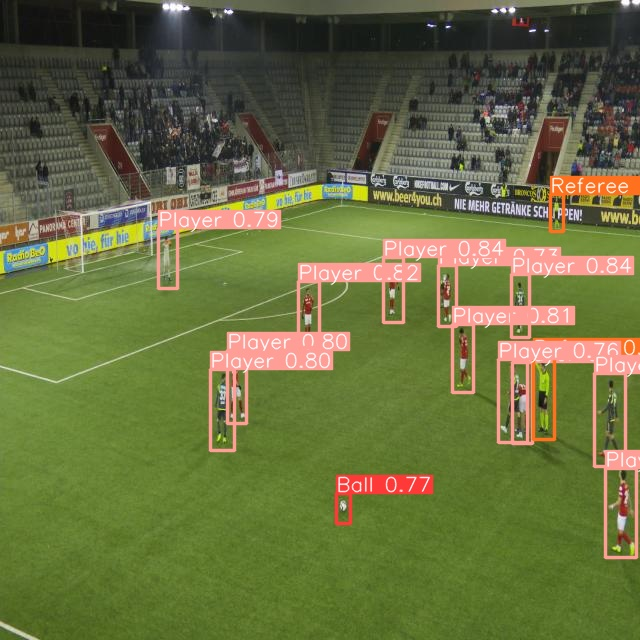

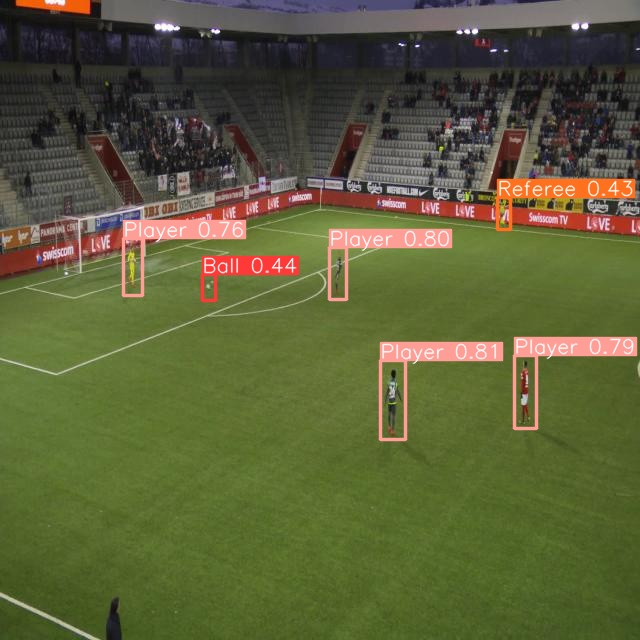

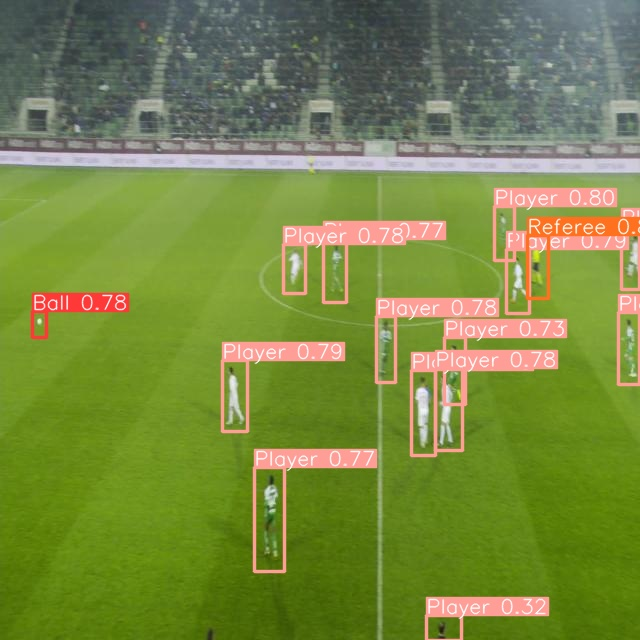

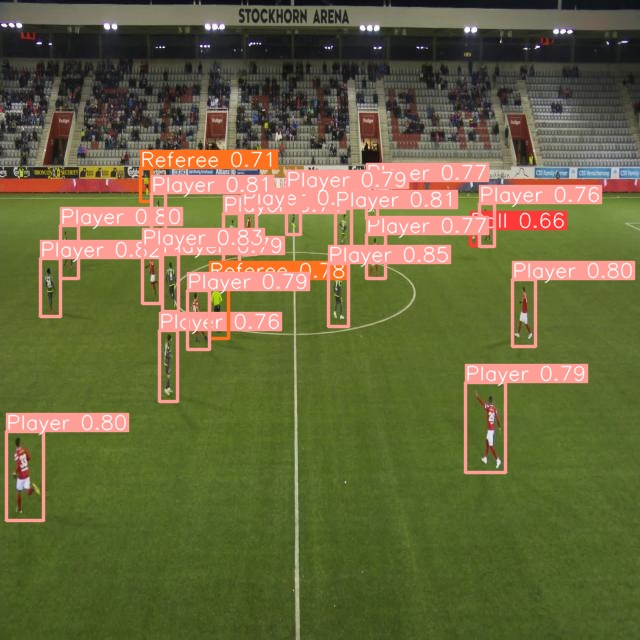

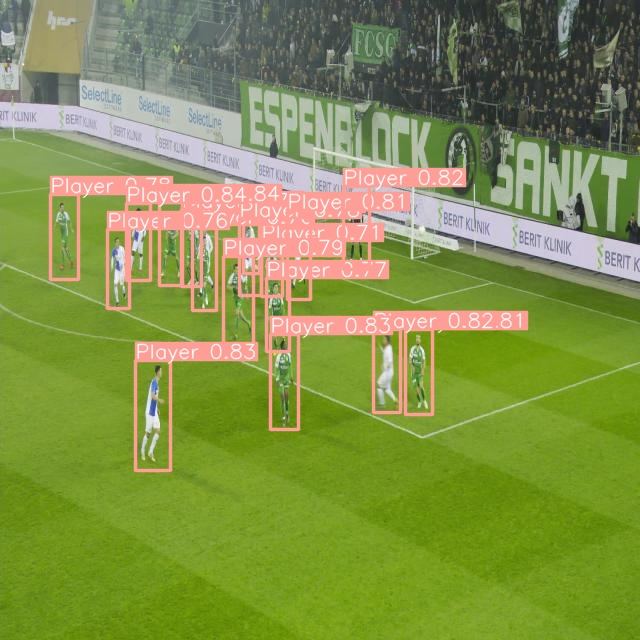

...

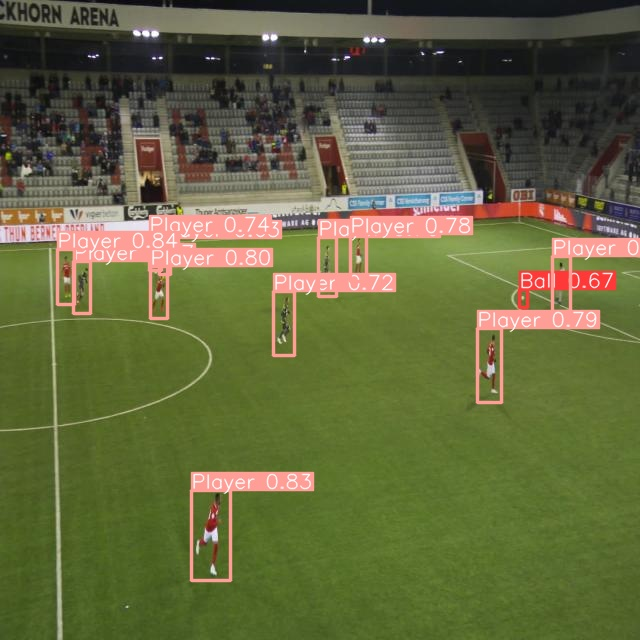

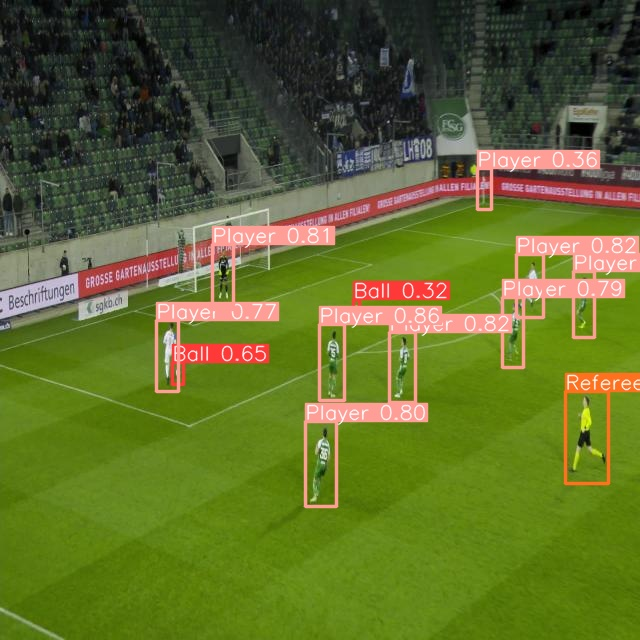

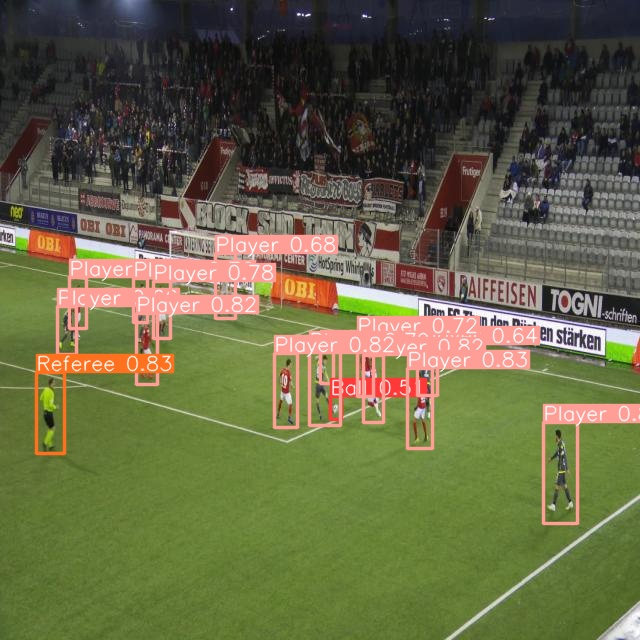

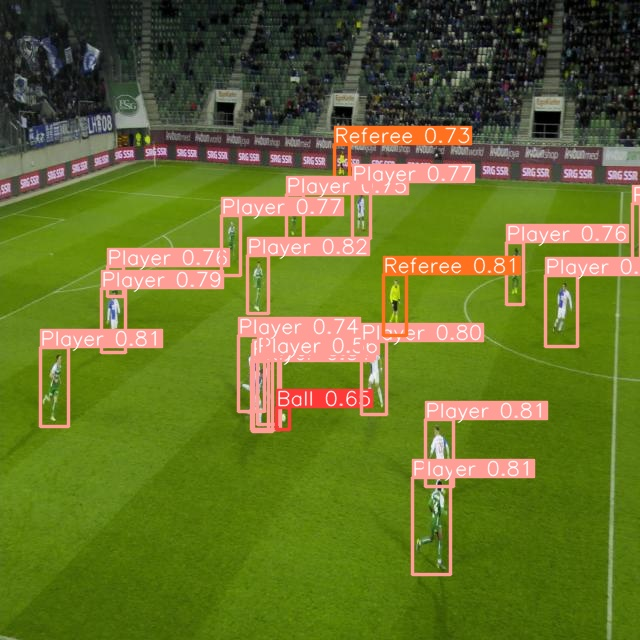

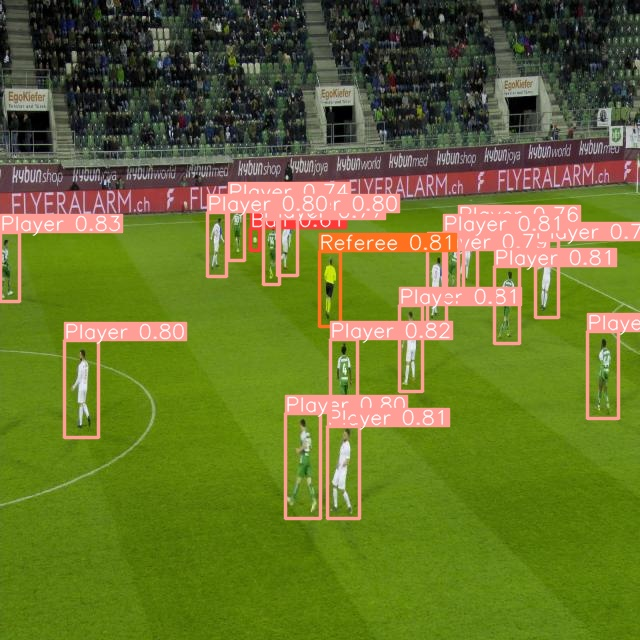

In [11]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

# SAVING PLOTS AND MODELS

In [12]:
!zip -r {HOME}/yolov8.zip {HOME}/runs and {HOME}/datasets and yolov8n.pt and yolov8s.pt

	zip warning: name not matched: and
	zip warning: name not matched: and
	zip warning: name not matched: and
  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/predict/ (stored 0%)
  adding: content/runs/detect/predict/SNMOT-111000661_jpg.rf.5eaf4fef3934cb0dd282a72b2573e1ab.jpg (deflated 4%)
  adding: content/runs/detect/predict/SNMOT-098000181_jpg.rf.0290fa7bdc812027f2e908f11f529ec5.jpg (deflated 4%)
  adding: content/runs/detect/predict/SNMOT-067000481_jpg.rf.69e756f0c951aa3718c8f08c1a53b273.jpg (deflated 3%)
  adding: content/runs/detect/predict/SNMOT-102000241_jpg.rf.5d6334c47936b7f46a22a215a154d438.jpg (deflated 3%)
  adding: content/runs/detect/predict/SNMOT-067000301_jpg.rf.804dfdc53b0d42d1788e9d7d3fcb31db.jpg (deflated 4%)
  adding: content/runs/detect/predict/SNMOT-060000241_jpg.rf.05e05c4cd97c1ba2610e31f1a9209e4d.jpg (deflated 3%)
  adding: content/runs/detect/predict/SNMOT-069000001_jpg.rf.67cb428ae55d48b3985ebaceef8b7